In [1]:
from PIL import Image
import os
import cv2
import numpy as np
import glob
import time
import matplotlib.pyplot as plt

<h2> Import of Libraries </h2>  

In [2]:
# Função para ler as imagens de uma pasta e retornar um dicionário
def ler_imagens_de_pasta(folder_name):
    images = {}
    print(f"Imagens do folder {folder_name}:")
    
    for filename in os.listdir(folder_name):
        if filename.endswith(".png"):
            file_path = os.path.join(folder_name, filename)
            image = Image.open(file_path)
            
            # Armazene a imagem no dicionário, usando o nome do arquivo como chave
            images[filename] = image
            
            print(f"Imagem lida: {filename}")
    
    return images

# Lista de nomes de pastas
folders = ["GreyBackground", "WhiteBackground", "IntrinsicCalibration"]

# Dicionário para armazenar as imagens
image_arrays = {}

# Para cada pasta, chame a função ler_imagens_de_pasta e armazene o resultado no dicionário image_arrays
for folder_name in folders:
    image_arrays[f"array_{folder_name}"] = ler_imagens_de_pasta(folder_name)
    print("")

# Agora você tem dicionários separados para cada pasta com o nome da pasta como chave
print(image_arrays["array_GreyBackground"])
print(image_arrays["array_WhiteBackground"])
print(image_arrays["array_IntrinsicCalibration"])

Imagens do folder GreyBackground:
Imagem lida: calib_img 5.png
Imagem lida: calib_img 4.png
Imagem lida: calib_img 0.png
Imagem lida: calib_img 1.png
Imagem lida: calib_img 3.png
Imagem lida: calib_img 2.png
Imagem lida: extrinsic.png

Imagens do folder WhiteBackground:
Imagem lida: calib_img 0.png
Imagem lida: calib_img 1.png
Imagem lida: calib_img 3.png
Imagem lida: calib_img 2.png
Imagem lida: extrinsic.png

Imagens do folder IntrinsicCalibration:
Imagem lida: calib_img 32.png
Imagem lida: calib_img 26.png
Imagem lida: calib_img 6.png
Imagem lida: calib_img 7.png
Imagem lida: calib_img 27.png
Imagem lida: calib_img 33.png
Imagem lida: calib_img 25.png
Imagem lida: calib_img 31.png
Imagem lida: calib_img 19.png
Imagem lida: calib_img 5.png
Imagem lida: calib_img 18.png
Imagem lida: calib_img 4.png
Imagem lida: calib_img 30.png
Imagem lida: calib_img 24.png
Imagem lida: calib_img 0.png
Imagem lida: calib_img 20.png
Imagem lida: calib_img 34.png
Imagem lida: calib_img 35.png
Imagem lid

<h1> Exercises Resolution </h1>

<h2> 1. Calibrate the intrinsic parameters and lens distortion of the camera. Show the intrinsic matrix and the lens distortion coefficients. </h2>

In [3]:
# Dicionário com imagens
intrinsicimages = image_arrays["array_IntrinsicCalibration"]
intrinsicimages

{'calib_img 32.png': <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=1920x1080>,
 'calib_img 26.png': <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=1920x1080>,
 'calib_img 6.png': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1920x1080>,
 'calib_img 7.png': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1920x1080>,
 'calib_img 27.png': <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=1920x1080>,
 'calib_img 33.png': <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=1920x1080>,
 'calib_img 25.png': <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=1920x1080>,
 'calib_img 31.png': <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=1920x1080>,
 'calib_img 19.png': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1920x1080>,
 'calib_img 5.png': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1920x1080>,
 'calib_img 18.png': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1920x1080>,
 'calib_img 4.png': <PIL.PngImagePlugin.PngImageFil

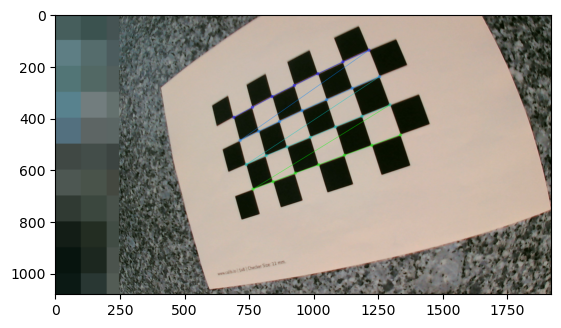

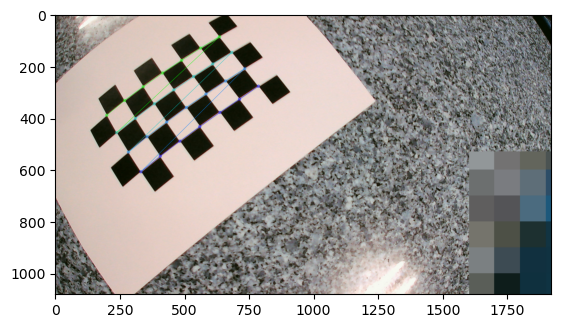

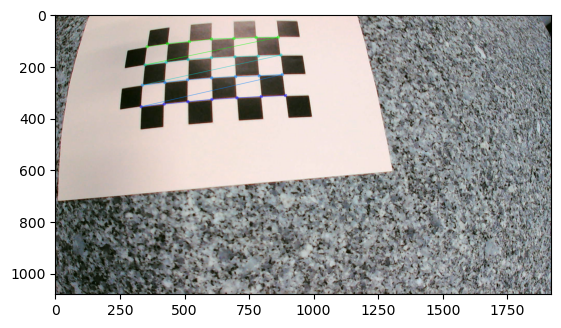

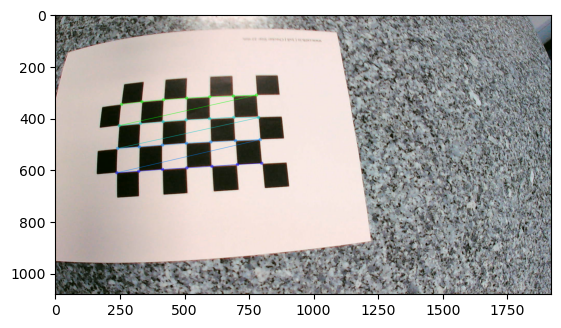

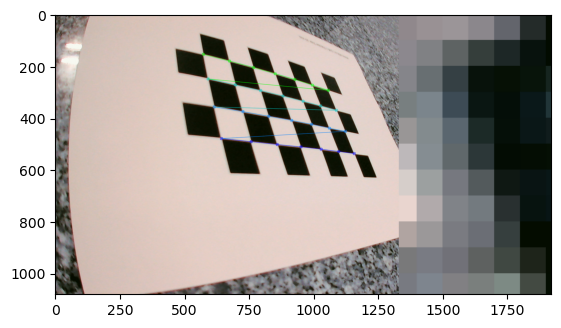

...

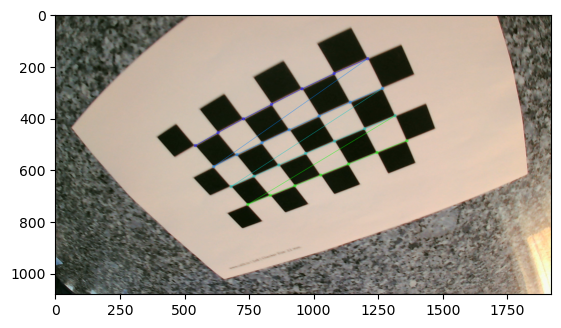

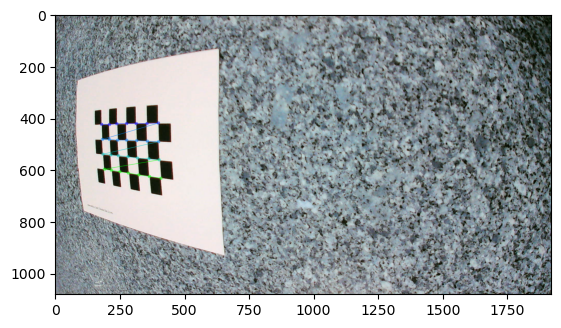

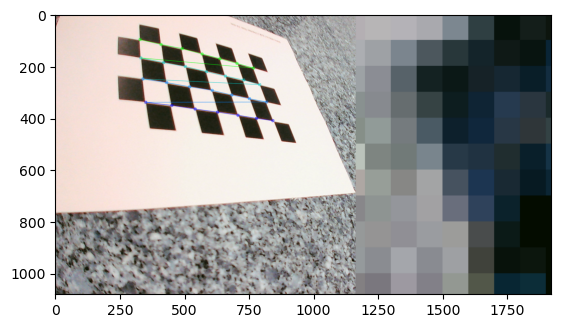

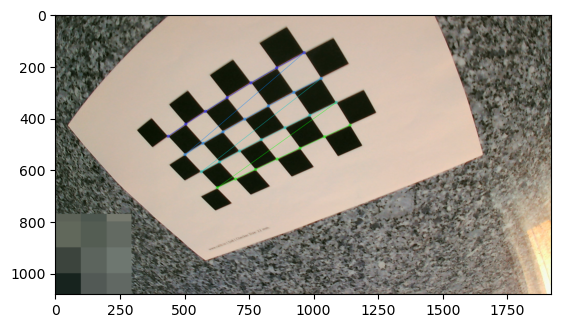

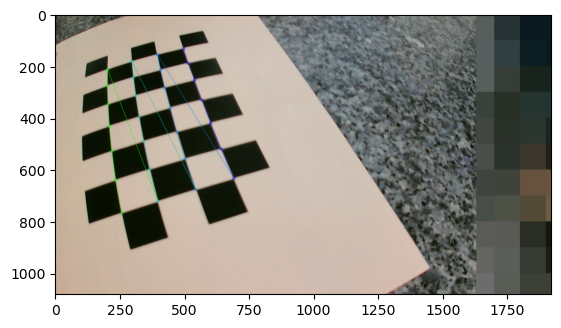

In [4]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((7 * 4,3), np.float32)
objp[:,:2] = np.mgrid[0:7, 0:4].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('IntrinsicCalibration/*.png')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (7, 4), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (7, 4), corners, ret)
        plt.imshow(img)
        plt.show()
        time.sleep(1)

Text(0.5, 1.0, 'Undistorted Image')

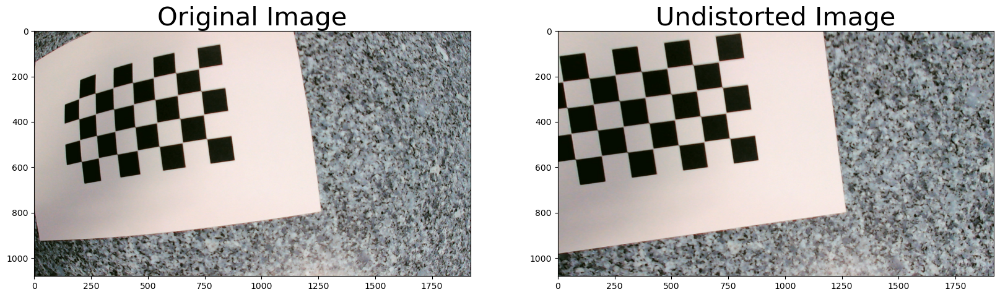

In [5]:
#import pickle
%matplotlib inline

# Test undistortion on an image
img = cv2.imread('IntrinsicCalibration/calib_img 18.png')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)


dst = cv2.undistort(img, mtx, dist, None, mtx)
#cv2.imwrite('IntrinsicCalibration/test_undist.jpg',dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
'''dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist'''
#pickle.dump( dist_pickle, open( "calibration_wide/wide_dist_pickle.p", "wb" ) )
#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

<h2> 2. Calibrate the extrinsic parameters of the camera setup (or instead, use 
the  extrinsic  image  to  manually  measure  the  dimensions  of  a  black 
square  of  the  chessboard  in  pixels.  In  this  way,  you  will  know  the 
conversion between pixel to millimeter). Show the extrinsic matrix 
(rotation,  translation,  etc)  and/or  the  conversion  ratio  between  pixel  to 
millimeter that was used.  </h2>

<h2> 3. Consider only the images retrieved from a White Background. Implement the functions described above. </h2>

In [16]:
# Dicionário com imagens
whiteimages = image_arrays["array_WhiteBackground"]

<h3> 3.1 Define a ROI (region of interest) for the image </h3> 

In [ ]:
def define_roi(image, x, y, width, height):
    roi = image.crop((x, y, x + width, y + height))
    return roi

In [10]:
# Exemplo de uso:
x = 100
y = 150
width = 200
height = 150

# Iterar por todas as imagens e criar ROI para cada uma
roi_images = {}
for image_name, image in whiteimages.items():
    roi = define_roi(image, x, y, width, height)
    roi.show()
    roi_images[image_name] = roi

<h3> 3.2 Calculate the number of M&M per color for all images provided </h3>

In [11]:
def count_mms_by_color(image, color_masks):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    counts = {}
    for color, mask in color_masks.items():
        result = cv2.bitwise_and(image, image, mask=mask)
        mms_count = np.sum(mask > 0) // 255
        counts[color] = mms_count
    return counts

In [17]:
# Suponha que whiteimages seja o seu dicionário de imagens
color_counts = {}  # Dicionário para armazenar a contagem de M&Ms por cor

for image_name, image in whiteimages.items():
    # Carregue a imagem em formato RGB (por exemplo, utilizando PIL)
    image_rgb = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)

    # Converta a imagem BGR para o espaço de cores HSV
    hsv_image = cv2.cvtColor(image_rgb, cv2.COLOR_BGR2HSV)

    # Defina os intervalos de cor para M&M amarelo
    lower_yellow = np.array([20, 100, 100])
    upper_yellow = np.array([30, 255, 255])

    # Defina os intervalos de cor para M&M azul
    lower_blue = np.array([90, 50, 50])
    upper_blue = np.array([130, 255, 255])

    # Defina os intervalos de cor para M&M vermelho
    lower_red1 = np.array([0, 100, 100])
    upper_red1 = np.array([10, 255, 255])
    lower_red2 = np.array([160, 100, 100])
    upper_red2 = np.array([180, 255, 255])

    # Defina os intervalos de cor para M&M verde
    lower_green = np.array([40, 100, 100])
    upper_green = np.array([80, 255, 255])

    color_masks = {
        "Yellow": cv2.inRange(hsv_image, lower_yellow, upper_yellow),
        "Blue": cv2.inRange(hsv_image, lower_blue, upper_blue),
        "Red": cv2.inRange(hsv_image, lower_red1, upper_red1) | cv2.inRange(hsv_image, lower_red2, upper_red2),
        "Green": cv2.inRange(hsv_image, lower_green, upper_green)
    }

    # Conte o número de M&M por cor na imagem atual
    counts = count_mms_by_color(hsv_image, color_masks)
    
    color_counts[image_name] = counts

In [18]:
color_counts

{'calib_img 0.png': {'Yellow': 23, 'Blue': 31, 'Red': 0, 'Green': 0},
 'calib_img 1.png': {'Yellow': 168, 'Blue': 195, 'Red': 0, 'Green': 0},
 'calib_img 2.png': {'Yellow': 154, 'Blue': 244, 'Red': 106, 'Green': 0},
 'calib_img 3.png': {'Yellow': 144, 'Blue': 1106, 'Red': 102, 'Green': 31},
 'extrinsic.png': {'Yellow': 6, 'Blue': 71, 'Red': 0, 'Green': 0}}

<h3> 3.3 Determine the average area for peanuts in pixels, considering the 
image “calib_img 3” </h3>

<h4> 3.3.1 Show all peanuts that were detected </h4>

<h4> 3.3.2 Discuss the limitations of the peanut detection method used (in 2 sentences) </h4>

<h3> 3.4 Determine the average area (and standard deviation) for peanuts 
in millimeters and grouped by color, considering images “calib_img 
2” and “calib_img 3” </h3>

<h4> 3.4.1 Show  the  result  in  a  table  color  vs  area  and  standard deviation </h4>

<h4> 3.4.2 Discuss  the  limitation  of  the  method  implemented  (in  2 sentences) </h4>

<h3> 3.5 Provide some recommendations that the M&M factory should take 
into  consideration to  improve  the  performance  of  the quality 
assurance  process  based  on  image  processing  (e.g.,  imaging 
setup, calibration process and photometric effects), in 4 sentences. </h3>